Total frames: 41


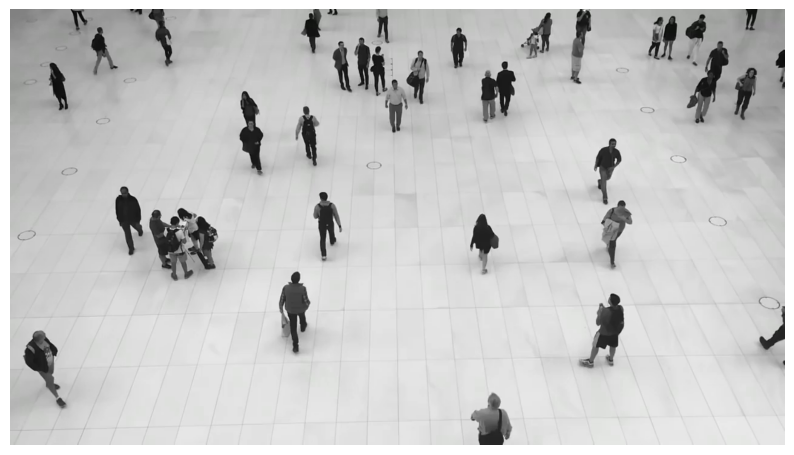

In [1]:
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import display, clear_output
import time

image_folder = "images"
frames = sorted([f for f in os.listdir(image_folder) if f.lower().endswith((".png",".jpg",".jpeg"))])

print("Total frames:", len(frames))

first = cv2.imread(os.path.join(image_folder, frames[0]))
first_rgb = cv2.cvtColor(first, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,6))
plt.imshow(first_rgb)
plt.axis("off")
plt.show()


In [2]:
first_bgr = cv2.imread(os.path.join(image_folder, frames[0]))

r = cv2.selectROI("Select Person to Track (press ENTER)", first_bgr, False, False)
cv2.destroyAllWindows()

x, y, w, h = r
print("Selected ROI:", r)


Selected ROI: (493, 295, 64, 128)


In [3]:
tracker = cv2.TrackerCSRT_create()
tracker.init(first_bgr, (x, y, w, h))

print("Tracker initialized.")


Tracker initialized.


In [4]:
height, width, _ = first_bgr.shape
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('tracking_result.mp4', fourcc, 20, (width, height))


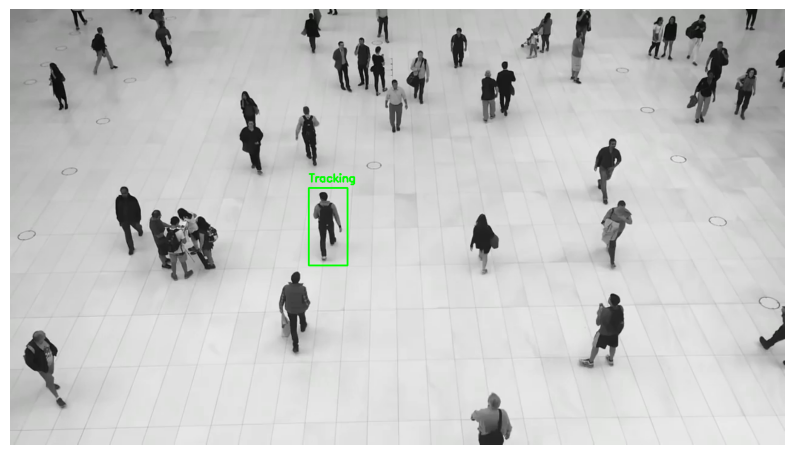

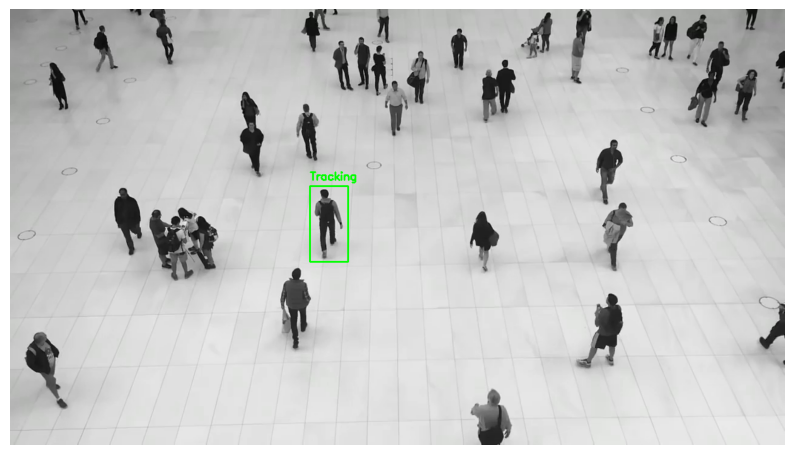

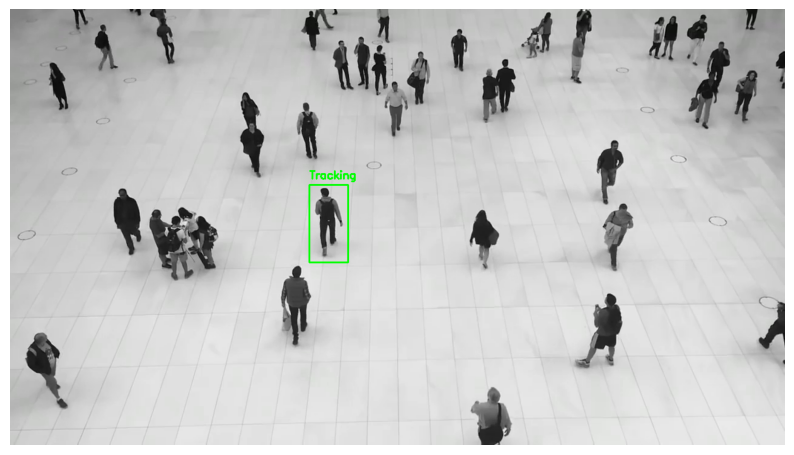

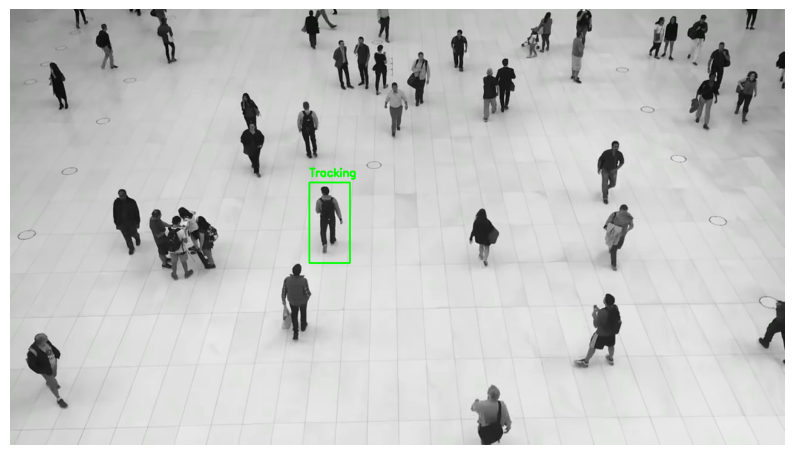

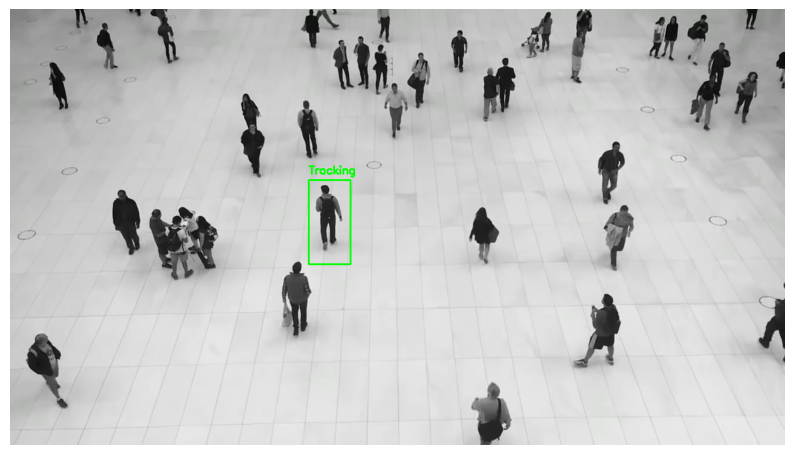

...

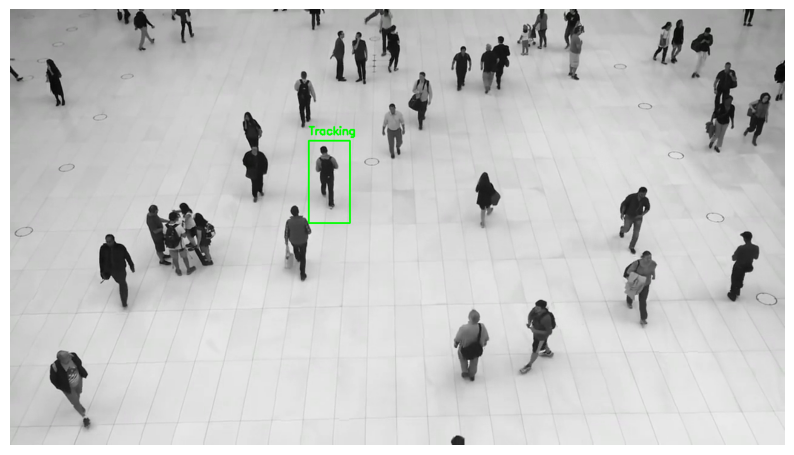

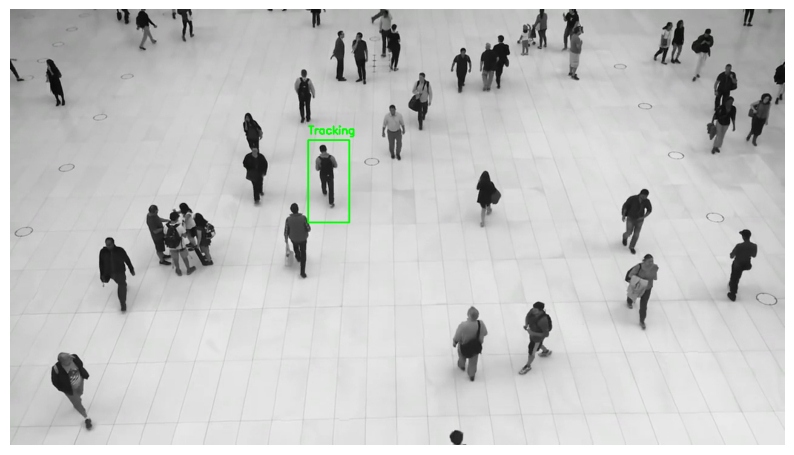

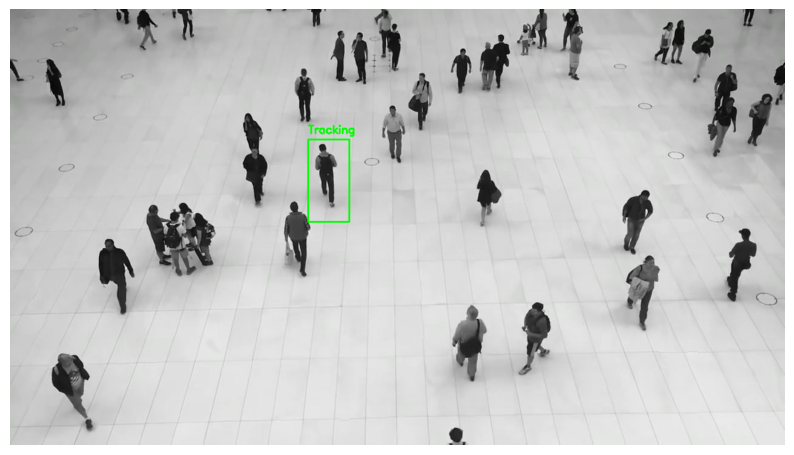

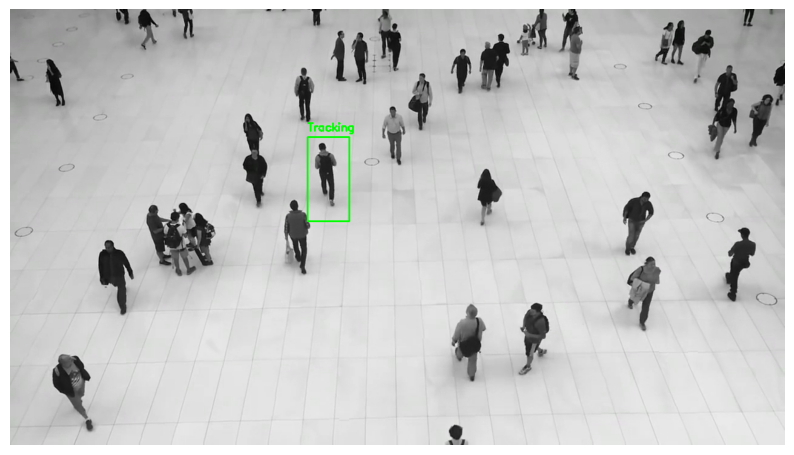

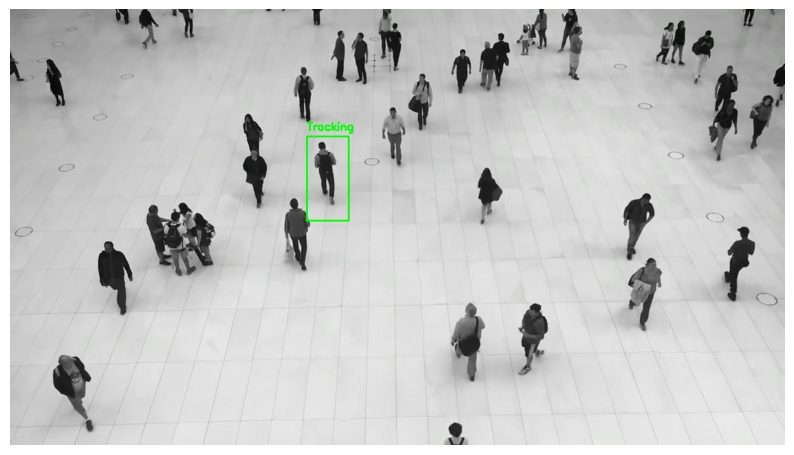

In [5]:
for i, fname in enumerate(frames):
    frame = cv2.imread(os.path.join(image_folder, fname))

    ok, box = tracker.update(frame)

    if ok:
        x, y, w, h = [int(v) for v in box]
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0,255,0), 2)
        cv2.putText(frame, "Tracking", (x, y-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)
    else:
        cv2.putText(frame, "Lost!", (20, 40),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,0,255), 2)

    # Write frame to video
    out.write(frame)
    
    # show in notebook
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,6))
    plt.imshow(frame_rgb)
    plt.axis("off")
    display(plt.gcf())
    clear_output(wait=True)
    time.sleep(0.05)


In [6]:
out.release()
print("Video saved successfully!")

Video saved successfully!
